In [1]:
import pandas as pd
import numpy as np
import os
from collections import Counter
import seaborn as sns
import matplotlib.pylab as plt
import scipy
from sklearn import feature_selection
from sklearn.preprocessing import LabelEncoder,StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC,LinearSVC
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier,GradientBoostingClassifier
# import xgboost
# import lightgbm
# from imblearn.over_sampling import SMOTE
from sklearn.metrics import accuracy_score,make_scorer
from sklearn.model_selection import GridSearchCV,KFold,cross_val_score,train_test_split
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
# from vecstack import stacking

D:\Python\lib\site-packages\sklearn\ensemble\weight_boosting.py:29: DeprecationWarning: numpy.core.umath_tests is an internal NumPy module and should not be imported. It will be removed in a future NumPy release.
  from numpy.core.umath_tests import inner1d


## set up default setting

In [2]:
plt.rcParams['figure.figsize']=(12,10)
os.chdir('e:/data set/proofpoint')
files=os.listdir('e:/data set/proofpoint')
files

['test_features.csv', 'train_features.csv', 'train_labels.csv']

## read and look at the data

In [3]:
#read the data
X_train=pd.read_csv(files[1],header=None)
Y_train=pd.read_csv(files[2],header=None,names=['Class'])

In [4]:
X_test=pd.read_csv(files[0],header=None)

In [5]:
print(X_test.shape)
X_test.head(10)

(560, 903)


,0,1,2,3,4,5,6,7,8,9,...,893,894,895,896,897,898,899,900,901,902
0,left,type_1,blue,-0.0911,0.5625,1.8206,-5.1902,3.0139,-1.4510,-4.9192,...,-2.6555,5.5905,7.7045,4.3253,0.7936,-0.6663,2.3355,0.3455,-2.0936,3.0695
1,right,type_3,green,-7.9454,-1.9499,1.1313,-0.2745,3.6763,1.2331,-0.7179,...,3.5414,-0.6960,2.5997,-0.7971,-5.1642,-0.7928,-1.8232,0.6038,-6.7637,-1.8046
2,right,type_3,blue,-4.9606,2.6980,0.0592,2.0149,1.7465,4.3341,6.7963,...,1.4680,-5.9941,2.4825,1.0533,0.4715,3.4329,-2.8285,-1.5425,6.9466,-2.8522
3,right,type_2,blue,1.9404,-1.1492,-2.7282,0.8090,3.4097,2.0182,-1.1578,...,-0.5082,-0.2061,4.1618,-2.7309,4.6747,-0.3183,1.3629,1.3480,5.3539,-4.7206
4,left,type_2,blue,-6.6614,-2.3878,-2.0364,-4.9774,3.7972,-1.9987,-0.4928,...,-2.6871,0.3611,-3.2261,1.8367,-0.5666,-3.0393,-2.2726,3.9492,-0.9959,4.9632
5,left,type_3,blue,-7.0804,4.7521,-0.7193,-0.8520,3.5342,-0.0818,-2.3306,...,-5.7464,0.6665,-4.0711,-1.0750,-4.6194,-2.2883,3.2951,-1.3884,-0.4559,1.1102
6,right,type_3,red,-4.9623,-3.1957,2.2014,-4.1882,1.9512,-2.4017,2.5518,...,-2.0830,-2.1326,-1.4899,1.8795,-3.8120,0.2183,-0.1801,-3.4903,1.5097,5.6410
7,right,type_1,green,-3.6500,5.2491,-5.1610,-0.8810,-2.8567,7.6848,1.9487,...,1.4075,-0.1042,-3.8891,-2.6104,0.1959,0.9930,2.6469,0.2432,-1.9449,4.3882
8,right,type_2,red,-8.0281,3.7174,4.6029,-1.7508,1.0362,0.9949,0.1876,...,-6.9424,-2.4892,-2.4765,-1.0664,-2.8214,0.9429,8.6729,0.5068,5.7191,-2.1031
9,left,type_2,red,-0.9811,1.6197,-4.6824,-1.6023,1.7270,0.3307,-4.8432,...,-1.3358,3.9258,7.1364,1.1438,-0.0962,1.8478,3.0353,-0.4371,1.6165,-5.8152


In [14]:
print(X_train.shape)
X_train.head()

(140, 903)


,0,1,2,3,4,5,6,7,8,9,...,893,894,895,896,897,898,899,900,901,902
0,right,type_3,green,0.8827,3.2917,1.4651,-4.5278,1.0490,2.3398,1.8729,...,0.8854,-0.8752,0.2662,4.9686,2.5588,-0.6121,-3.3692,0.0550,-1.5296,-5.3041
1,left,type_2,blue,1.4458,-2.9575,-1.2341,-3.9684,-2.7645,5.6346,1.7838,...,-4.3774,-2.2512,-1.6331,7.2724,1.7616,4.2826,5.5557,1.0588,2.6734,-4.5224
2,right,type_2,green,-10.2982,-0.3714,-0.9886,-3.2219,4.0925,-0.8319,-3.0588,...,-1.4408,-2.5580,-1.2116,5.1098,-0.6747,-1.2528,-2.2944,-3.4745,2.8633,1.6737
3,right,type_1,red,-8.4566,-0.2408,-3.0342,2.9534,2.8977,0.8851,3.0113,...,0.9434,-0.8771,0.4143,4.3368,-11.2949,-7.4289,7.9900,-6.2433,1.6592,-4.8601
4,left,type_1,blue,4.2681,-2.2052,-5.9093,0.1036,1.8462,1.9801,2.1129,...,-0.2290,0.5390,0.7648,1.1348,1.9829,3.7682,-1.7092,1.4791,5.7732,-3.9106


In [7]:
Y_train.head()

,Class
0,1
1,1
2,1
3,2
4,1


In [15]:
df_train=pd.concat([X_train,X_test],ignore_index=True)
df_train.head()

,0,1,2,3,4,5,6,7,8,9,...,893,894,895,896,897,898,899,900,901,902
0,right,type_3,green,0.8827,3.2917,1.4651,-4.5278,1.0490,2.3398,1.8729,...,0.8854,-0.8752,0.2662,4.9686,2.5588,-0.6121,-3.3692,0.0550,-1.5296,-5.3041
1,left,type_2,blue,1.4458,-2.9575,-1.2341,-3.9684,-2.7645,5.6346,1.7838,...,-4.3774,-2.2512,-1.6331,7.2724,1.7616,4.2826,5.5557,1.0588,2.6734,-4.5224
2,right,type_2,green,-10.2982,-0.3714,-0.9886,-3.2219,4.0925,-0.8319,-3.0588,...,-1.4408,-2.5580,-1.2116,5.1098,-0.6747,-1.2528,-2.2944,-3.4745,2.8633,1.6737
3,right,type_1,red,-8.4566,-0.2408,-3.0342,2.9534,2.8977,0.8851,3.0113,...,0.9434,-0.8771,0.4143,4.3368,-11.2949,-7.4289,7.9900,-6.2433,1.6592,-4.8601
4,left,type_1,blue,4.2681,-2.2052,-5.9093,0.1036,1.8462,1.9801,2.1129,...,-0.2290,0.5390,0.7648,1.1348,1.9829,3.7682,-1.7092,1.4791,5.7732,-3.9106


In [16]:
df=pd.merge(left=X_train,right=Y_train,left_index=True,right_index=True)
df.head()

,0,1,2,3,4,5,6,7,8,9,...,894,895,896,897,898,899,900,901,902,Class
0,right,type_3,green,0.8827,3.2917,1.4651,-4.5278,1.0490,2.3398,1.8729,...,-0.8752,0.2662,4.9686,2.5588,-0.6121,-3.3692,0.0550,-1.5296,-5.3041,1
1,left,type_2,blue,1.4458,-2.9575,-1.2341,-3.9684,-2.7645,5.6346,1.7838,...,-2.2512,-1.6331,7.2724,1.7616,4.2826,5.5557,1.0588,2.6734,-4.5224,1
2,right,type_2,green,-10.2982,-0.3714,-0.9886,-3.2219,4.0925,-0.8319,-3.0588,...,-2.5580,-1.2116,5.1098,-0.6747,-1.2528,-2.2944,-3.4745,2.8633,1.6737,1
3,right,type_1,red,-8.4566,-0.2408,-3.0342,2.9534,2.8977,0.8851,3.0113,...,-0.8771,0.4143,4.3368,-11.2949,-7.4289,7.9900,-6.2433,1.6592,-4.8601,2
4,left,type_1,blue,4.2681,-2.2052,-5.9093,0.1036,1.8462,1.9801,2.1129,...,0.5390,0.7648,1.1348,1.9829,3.7682,-1.7092,1.4791,5.7732,-3.9106,1


Text(0.5,1,'Class Count')

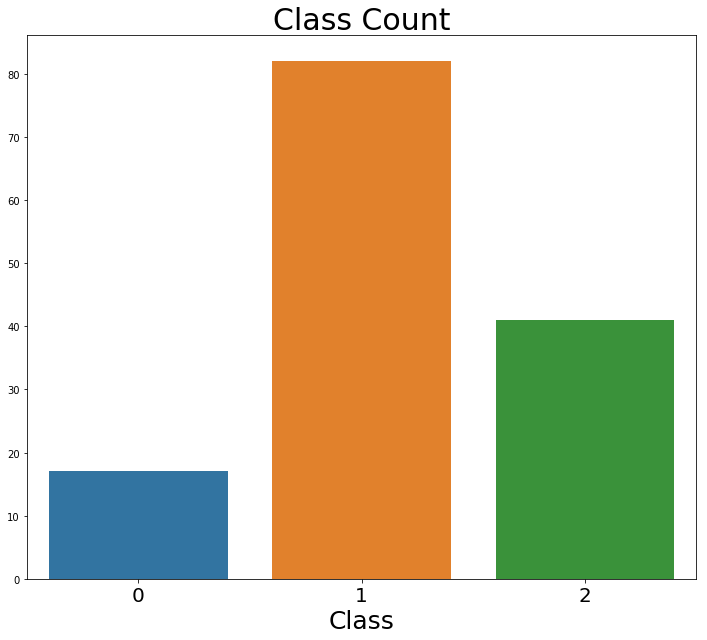

In [10]:
#exam the class, class 1 is the highest
fig,aes=plt.subplots()
C=Counter(df['Class'])
sns.barplot(x=list(C.keys()),y=list(C.values()),ax=aes)
plt.xticks(fontsize=20)
plt.xlabel('Class',fontsize=25)
plt.title('Class Count',fontsize=30)

## data cleaning

In [8]:
#exam missing value
def missing_rate(data):
    length=data.shape[0]
    Boolean_data=pd.isnull(data)
    result=Boolean_data.apply(lambda x:x.sum()/length,0)
    result=result.sort_values(ascending=False)
    return result

In [9]:
#exam outlier
def index_outlier(data,count=True):
    Q1=data.quantile(0.25)
    Q3=data.quantile(0.75)
    IQR=Q3-Q1
    if count:
        return len(np.nonzero(data.apply(lambda x: x>Q3+1.5*IQR or x<Q1-1.5*IQR))[0])
    else:
        return np.nonzero(data.apply(lambda x: x>Q3+1.5*IQR or x<Q1-1.5*IQR))[0]

In [17]:
result=missing_rate(df)
result[result!=0]
#no missing value

Series([], dtype: float64)

In [14]:
df_train.describe()

,3,4,5,6,7,8,9,10,11,12,...,893,894,895,896,897,898,899,900,901,902
count,700.000000,700.000000,700.000000,700.000000,700.000000,700.000000,700.000000,700.000000,700.000000,700.000000,...,700.000000,700.000000,700.000000,700.000000,700.000000,700.000000,700.000000,700.000000,700.000000,700.000000
mean,-3.455281,0.714531,-0.556238,-2.646707,0.572476,0.196757,0.161219,-0.754162,-1.399068,-0.656095,...,-1.623179,-1.501523,0.111861,0.359558,-0.035883,0.597023,0.969758,-0.421419,0.647394,-0.350407
std,3.901195,3.099545,3.210871,3.318276,3.441654,3.160786,3.229462,3.346758,3.811186,3.080486,...,3.114898,3.162574,3.311684,3.217319,3.551528,3.173194,3.202271,3.088440,3.655397,3.592197
min,-14.183100,-8.140200,-9.688800,-12.485400,-10.586300,-8.308200,-8.397000,-12.279500,-12.975600,-10.185400,...,-13.296000,-10.765300,-10.064300,-10.166300,-11.294900,-8.784100,-7.380000,-10.298900,-10.771500,-12.007300
25%,-6.202525,-1.629425,-2.662875,-4.832325,-1.988800,-1.999625,-2.113775,-2.984625,-4.029925,-2.805425,...,-3.714525,-3.673650,-2.091025,-1.877425,-2.553925,-1.402425,-1.234675,-2.528975,-1.948100,-2.881425
50%,-3.608200,0.842750,-0.754050,-2.875100,0.611650,0.087950,0.140850,-0.799600,-1.228000,-0.704750,...,-1.669450,-1.594850,0.062650,0.317550,0.024900,0.645250,0.830700,-0.270550,0.540800,-0.171350
75%,-0.925025,2.823325,1.637125,-0.342275,3.036850,2.418075,2.237425,1.411850,1.262950,1.324200,...,0.432100,0.630500,2.402875,2.494275,2.410350,2.718100,3.020625,1.583375,3.215625,2.117050
max,8.860500,10.474400,10.305700,7.873800,11.816800,12.518700,9.032900,11.262400,8.874900,8.991700,...,10.018600,11.331200,11.747300,11.909600,9.775300,12.639000,11.869900,9.690400,11.274400,9.632300


## Feature engineering

In [18]:
#exam numeric value
def density_plot(data,col,class_label,class_columns_name):
    try:
        fig=plt.figure(figsize=(12,12))
        aes=fig.add_subplot(1,1,1)
        for i in class_label:
            sns.kdeplot(data.loc[(data[class_columns_name] == i).values, col].values, ax=aes, label='class '+str(i))
        handel = aes.get_legend_handles_labels()[0]
        label=aes.get_legend_handles_labels()[1]
        plt.title('columns {} Distribution'.format(col))
        plt.legend(handel, label,prop={'size': 12},loc=2)#location is upper left
    except Exception:
        pass

In [19]:
#anova
def f_anova(data,col,class_label,class_columns_name):
    arg=[data.loc[data[class_columns_name]==i,col] for i in class_label]
    f,p=scipy.stats.f_oneway(*arg)
    return f,p
#corr
def corv(data,col1,col2):
    return scipy.stats.stats.pearsonr(data[col1],data[col2])
#Kruskal
def H_test(data,col,class_label,class_columns_name):
    arg=[data.loc[data[class_columns_name]==i,col] for i in class_label]
    f,p=scipy.stats.kruskal(*arg)
    return f,p

### Numercial variable

In [20]:
Num_col=list(df_train.select_dtypes(exclude='O').columns)

#### define outlier and treat them based on context

In [21]:
Num_col_outlier=pd.Series(Num_col)[(df_train[Num_col].apply(index_outlier)!=0).values]

In [19]:
#take a look at thoes outliers
for col in Num_col_outlier:
    index_list=index_outlier(df_train[col],False)
    print(col)
    print('have {} outliers'.format(len(index_list)))
    print('the outliers are:\r\n{}'.format(df_train.loc[index_list,col]))
    print('the mean is {}'.format(np.mean(df_train[col])))
    print('the std is {}'.format(np.std(df_train[col],ddof=1)))
    print('\r\n')

3
have 7 outliers
the outliers are:
16      7.8625
39      7.0620
174     8.8605
435     8.2662
446     8.2338
477   -14.1831
501     7.0963
Name: 3, dtype: float64
the mean is -3.4552808571428573
the std is 3.901194598724235


4
have 2 outliers
the outliers are:
597    10.4744
694     9.7272
Name: 4, dtype: float64
the mean is 0.7145308571428571
the std is 3.0995449328026825


5
have 5 outliers
the outliers are:
101    -9.6888
171     8.3881
509    -9.5854
532     8.6752
650    10.3057
Name: 5, dtype: float64
the mean is -0.5562378571428571
the std is 3.2108713420151145


6
have 4 outliers
the outliers are:
174     6.8105
473   -12.3736
522     7.8738
554   -12.4854
Name: 6, dtype: float64
the mean is -2.646707
the std is 3.3182763818115375


7
have 3 outliers
the outliers are:
22     10.8560
212   -10.5863
345    11.8168
Name: 7, dtype: float64
the mean is 0.5724757142857143
the std is 3.441653771369873


8
have 2 outliers
the outliers are:
294    10.1502
305    12.5187
Name: 8, dtyp

the std is 3.071431565554497


66
have 7 outliers
the outliers are:
67     11.5657
114     8.8251
474    10.5408
486   -10.3215
650    10.0076
654    10.4504
684    -8.1848
Name: 66, dtype: float64
the mean is 0.41632857142857144
the std is 3.146617479246398


67
have 2 outliers
the outliers are:
228   -11.5607
233    10.4233
Name: 67, dtype: float64
the mean is 0.046460857142857116
the std is 3.3567227763538265


68
have 7 outliers
the outliers are:
11    -9.5526
277   -8.4560
306    9.7053
413    8.9020
418   -8.4281
498    8.6698
637   -9.1400
Name: 68, dtype: float64
the mean is 0.0122622857142857
the std is 3.267427772136554


69
have 5 outliers
the outliers are:
226    9.2896
532   -8.0109
587   -6.5956
649    9.8676
655    8.8726
Name: 69, dtype: float64
the mean is 1.0368017142857144
the std is 2.8467086864214886


70
have 4 outliers
the outliers are:
196   -11.3039
289   -11.0455
370   -10.8789
393     9.2018
Name: 70, dtype: float64
the mean is -1.5935611428571428
the std is 

125
have 1 outliers
the outliers are:
280   -14.9883
Name: 125, dtype: float64
the mean is -2.089934
the std is 4.199188335685388


126
have 5 outliers
the outliers are:
117    -8.1327
405    12.9025
438    -7.7353
570    12.4630
602    11.9238
Name: 126, dtype: float64
the mean is 2.4747847142857142
the std is 3.435007095324627


127
have 3 outliers
the outliers are:
96     8.6936
377    8.4774
411   -9.8467
Name: 127, dtype: float64
the mean is -0.5410807142857142
the std is 3.2852721370217317


128
have 3 outliers
the outliers are:
138    8.1838
312    8.0617
518    9.1424
Name: 128, dtype: float64
the mean is -0.30694499999999997
the std is 3.1251304228812407


129
have 3 outliers
the outliers are:
111   -10.4474
440     8.5939
642     9.3932
Name: 129, dtype: float64
the mean is -0.8766194285714286
the std is 3.4595773192324932


130
have 2 outliers
the outliers are:
522    11.8959
536    -7.5046
Name: 130, dtype: float64
the mean is 2.143936428571429
the std is 3.0973037071056133

the mean is -0.4761027142857143
the std is 3.146641756005345


226
have 5 outliers
the outliers are:
120   -8.0854
211   -7.7606
290   -9.5776
546   -8.1987
692    9.5509
Name: 226, dtype: float64
the mean is 0.7393642857142858
the std is 3.065855952717646


227
have 1 outliers
the outliers are:
113   -13.396
Name: 227, dtype: float64
the mean is 1.219702
the std is 4.547727220710078


228
have 4 outliers
the outliers are:
147    -8.5745
230    -8.7613
411     8.9820
599   -10.4555
Name: 228, dtype: float64
the mean is -0.07513642857142856
the std is 3.083344423269173


229
have 4 outliers
the outliers are:
35    -10.9231
146    -9.9451
347     6.5755
648     7.3288
Name: 229, dtype: float64
the mean is -1.6406898571428572
the std is 3.07370592515948


230
have 7 outliers
the outliers are:
8     -11.0599
24    -11.9890
95      6.7578
128   -11.4373
258     6.6653
285     6.8026
428   -11.9916
Name: 230, dtype: float64
the mean is -2.4277924285714287
the std is 3.1452291098613356


231


272
have 2 outliers
the outliers are:
10    -11.0234
360    10.3213
Name: 272, dtype: float64
the mean is -0.8441801428571429
the std is 3.52554340079144


273
have 4 outliers
the outliers are:
93     -9.5761
130     9.4224
305    -9.9181
602   -10.1908
Name: 273, dtype: float64
the mean is -0.12112499999999995
the std is 3.3815701933706968


274
have 7 outliers
the outliers are:
12     11.1005
321    -9.9529
447    12.0822
613    -8.8257
644    -8.8410
650    10.4309
679    11.1866
Name: 274, dtype: float64
the mean is 0.8591167142857141
the std is 3.48677825709157


275
have 8 outliers
the outliers are:
174    10.6807
321    -7.8806
489    10.4395
538     9.5941
597    -9.8755
605    -9.3377
664    10.9363
685     9.1969
Name: 275, dtype: float64
the mean is 0.7483565714285715
the std is 2.96749101737429


276
have 5 outliers
the outliers are:
180     9.5327
279    11.1626
376    -8.7808
390     9.2295
617    -7.6827
Name: 276, dtype: float64
the mean is 0.6471904285714286
the std is

325
have 2 outliers
the outliers are:
409    8.6243
431    8.0139
Name: 325, dtype: float64
the mean is -1.7149941428571427
the std is 3.6050510893472767


326
have 4 outliers
the outliers are:
28     -9.4380
171    -9.8438
465   -10.9275
581   -11.1446
Name: 326, dtype: float64
the mean is -0.9958217142857143
the std is 3.226408916889516


327
have 6 outliers
the outliers are:
128   -7.0682
202    9.7366
308    9.4242
315    8.6362
341    8.9980
571    9.6308
Name: 327, dtype: float64
the mean is 0.8051122857142856
the std is 3.076710541803741


328
have 3 outliers
the outliers are:
294   -9.3263
631    9.4722
682   -8.9677
Name: 328, dtype: float64
the mean is -0.4493651428571429
the std is 3.070248469096242


329
have 2 outliers
the outliers are:
164    8.0057
337    8.4880
Name: 329, dtype: float64
the mean is -0.9829308571428571
the std is 3.0610051940618552


330
have 7 outliers
the outliers are:
15     10.6309
199    11.7908
243    -9.1934
255    -9.3900
371   -12.4881
382     9

413
have 7 outliers
the outliers are:
43      8.5264
78    -10.6633
194     6.8164
218     8.5936
305     8.7180
431    -9.3505
488    -8.8301
Name: 413, dtype: float64
the mean is -0.938104857142857
the std is 3.007308752912009


414
have 6 outliers
the outliers are:
198     8.1160
249     7.1544
305     9.2528
314   -13.5083
534   -10.6670
546     7.3650
Name: 414, dtype: float64
the mean is -1.234765
the std is 3.120851246566207


415
have 7 outliers
the outliers are:
32     10.5073
304    10.9395
451    -6.5844
462    12.0450
490    10.7201
542    10.4257
557    10.8526
Name: 415, dtype: float64
the mean is 2.0101629999999995
the std is 3.1452470857201873


416
have 10 outliers
the outliers are:
107   -7.6316
116   -7.1551
193    9.6094
359   -7.1109
368   -7.1101
457   -8.7251
462    9.2562
505    9.7558
514   -7.9542
663    9.0447
Name: 416, dtype: float64
the mean is 1.011464857142857
the std is 3.0335607451333724


417
have 1 outliers
the outliers are:
499    9.4658
Name: 417, 

have 15 outliers
the outliers are:
80      9.4683
123     9.7665
125   -11.1200
189   -14.4086
212   -10.5380
221   -10.5961
226   -10.8106
304   -10.0946
362    -9.0864
393    -9.8296
400   -10.1966
508   -10.9731
520   -11.2586
550    -9.9589
653   -11.4983
Name: 498, dtype: float64
the mean is -0.07618299999999997
the std is 3.600203411684481


499
have 5 outliers
the outliers are:
52     -6.4155
144    -6.5952
157    11.1574
564    11.9272
575    10.5168
Name: 499, dtype: float64
the mean is 2.132241285714286
the std is 3.072973099106996


501
have 5 outliers
the outliers are:
68    -8.9525
119    7.7842
185   -8.6144
487    7.9009
572   -9.2472
Name: 501, dtype: float64
the mean is -0.2138767142857143
the std is 3.1268209374024925


502
have 1 outliers
the outliers are:
52   -10.2699
Name: 502, dtype: float64
the mean is -0.9522777142857142
the std is 3.106905148709753


503
have 8 outliers
the outliers are:
8     -11.6150
274     8.1434
306   -10.9834
428   -11.8104
452     7.927

566
have 2 outliers
the outliers are:
331    -8.9770
343   -10.0721
Name: 566, dtype: float64
the mean is -0.9139949999999999
the std is 2.91220754672654


567
have 2 outliers
the outliers are:
262    9.8777
274    9.3302
Name: 567, dtype: float64
the mean is -1.1551997142857144
the std is 3.3545050634078795


568
have 6 outliers
the outliers are:
369    -8.1056
537    -8.2827
560    11.9502
607    13.5262
659    -8.0964
693    11.9370
Name: 568, dtype: float64
the mean is 2.1074718571428575
the std is 3.41680448969007


570
have 7 outliers
the outliers are:
116   -7.7553
146   -7.3772
174   -8.3374
211   -7.7369
351   -9.2933
604   -6.8173
621   -6.9946
Name: 570, dtype: float64
the mean is 1.7367437142857145
the std is 3.3162919728411544


571
have 4 outliers
the outliers are:
164   -12.6452
219     6.9445
524     7.0940
576     7.3032
Name: 571, dtype: float64
the mean is -2.634347
the std is 3.398624092256025


572
have 5 outliers
the outliers are:
138    -8.0591
326    11.3055
559

the mean is -0.2992195714285714
the std is 3.30160118447814


612
have 5 outliers
the outliers are:
23    -10.4988
129    -9.3654
300    10.5029
438    10.5312
661    10.1720
Name: 612, dtype: float64
the mean is 0.0034475714285714383
the std is 3.3127638216156083


613
have 5 outliers
the outliers are:
143    -9.9856
191    11.2880
307    -9.3040
431    -9.3549
662    -9.2695
Name: 613, dtype: float64
the mean is -0.44740114285714283
the std is 3.154761583268412


614
have 2 outliers
the outliers are:
184    9.6410
384    7.8814
Name: 614, dtype: float64
the mean is -0.6912824285714285
the std is 3.140362058232562


615
have 1 outliers
the outliers are:
170   -12.1686
Name: 615, dtype: float64
the mean is -0.5914245714285714
the std is 3.126179226562574


616
have 13 outliers
the outliers are:
25     10.9895
230    11.5444
331    10.7509
334    12.5629
340    10.8634
380    11.7462
395    10.5083
507    12.5062
508    10.2831
576    12.6018
611    11.0550
667    10.4335
686    14.1662

the mean is 0.7343401428571429
the std is 3.123037561036102


676
have 8 outliers
the outliers are:
20     10.1834
69     -8.8939
126    -9.6922
222     8.7727
407     9.1507
439    -8.7851
486     8.9117
570    -8.3573
Name: 676, dtype: float64
the mean is 0.2783572857142857
the std is 3.077422774532067


677
have 3 outliers
the outliers are:
65    -10.5528
195     6.5494
323    -9.3902
Name: 677, dtype: float64
the mean is -1.5884595714285712
the std is 2.904335556383137


678
have 4 outliers
the outliers are:
226    -9.8624
234    -9.5708
339     8.6879
359   -10.2300
Name: 678, dtype: float64
the mean is -0.41360514285714284
the std is 3.346612036130583


679
have 6 outliers
the outliers are:
0      -8.9749
12     -8.3812
44     10.6187
193    10.4893
239    -9.4111
501   -10.2222
Name: 679, dtype: float64
the mean is 0.1891098571428571
the std is 3.286234014848332


680
have 5 outliers
the outliers are:
0       7.4890
233     7.8457
509   -10.2822
524   -10.6161
686    -9.2566
Nam

739
have 12 outliers
the outliers are:
36      7.0976
75      6.9571
137   -11.6426
189     7.9872
219     8.5912
254     6.8596
304     7.8129
308     9.7008
413     8.2450
509    10.0876
580     8.8767
664     6.9300
Name: 739, dtype: float64
the mean is -2.1829615714285717
the std is 3.541630483564311


740
have 4 outliers
the outliers are:
48     10.1831
90      8.6398
102     8.8671
431     8.7395
Name: 740, dtype: float64
the mean is -0.8259557142857142
the std is 3.4413311315960358


741
have 1 outliers
the outliers are:
36    9.9125
Name: 741, dtype: float64
the mean is 0.7127322857142857
the std is 2.9527165208530217


742
have 5 outliers
the outliers are:
354    7.4602
368    7.1758
522    7.5372
624    9.6845
655    7.5204
Name: 742, dtype: float64
the mean is -3.2937007142857144
the std is 3.726854504540113


743
have 3 outliers
the outliers are:
90     12.7856
227    13.4784
606    12.0114
Name: 743, dtype: float64
the mean is 0.7731431428571428
the std is 4.05835800065539

the std is 3.0007910579878696


785
have 5 outliers
the outliers are:
138    -7.1567
160    10.6142
551    11.6988
562    10.5364
597    10.0654
Name: 785, dtype: float64
the mean is 1.3245140000000002
the std is 3.0887439180477965


786
have 4 outliers
the outliers are:
188    10.5256
331    11.2199
362    10.9040
638    10.4629
Name: 786, dtype: float64
the mean is 1.2516032857142858
the std is 3.144051116793531


787
have 4 outliers
the outliers are:
157     9.6410
346   -10.5432
421   -10.6122
581   -10.1066
Name: 787, dtype: float64
the mean is -0.7843525714285714
the std is 3.320850937725787


789
have 6 outliers
the outliers are:
108    10.7099
182    -9.2775
313    -9.8854
443    -8.4744
522    11.2238
657    -8.9568
Name: 789, dtype: float64
the mean is 1.0982148571428572
the std is 3.489440676235838


790
have 4 outliers
the outliers are:
25     11.2030
424    11.3452
550    -8.4391
679    11.2079
Name: 790, dtype: float64
the mean is 2.6281735714285714
the std is 3.185229052

853
have 4 outliers
the outliers are:
101    -9.4593
171    -9.9971
306    11.7261
486     7.2492
Name: 853, dtype: float64
the mean is -1.127025857142857
the std is 2.916739005373602


854
have 3 outliers
the outliers are:
230   -10.0390
237    11.1582
412    -8.3878
Name: 854, dtype: float64
the mean is 0.9072175714285715
the std is 3.3557321274894343


855
have 2 outliers
the outliers are:
180   -13.3712
454   -11.3555
Name: 855, dtype: float64
the mean is -1.6456985714285715
the std is 2.967651210239266


856
have 6 outliers
the outliers are:
93    -12.1535
224    10.8574
290    10.2685
510     9.8456
533    11.0189
541   -12.0013
Name: 856, dtype: float64
the mean is -0.5564408571428572
the std is 3.923774420969494


857
have 5 outliers
the outliers are:
214    -8.6848
306   -10.5044
635    11.1994
667    -8.8454
672     9.0175
Name: 857, dtype: float64
the mean is 0.37782400000000005
the std is 3.0593551924338267


858
have 2 outliers
the outliers are:
162   -8.7534
572   -8.8848

898
have 7 outliers
the outliers are:
100    -7.6957
133    12.6390
208     9.0847
388    -8.7841
393    10.0123
665     9.9881
697    11.0256
Name: 898, dtype: float64
the mean is 0.5970232857142856
the std is 3.173193619606494


899
have 7 outliers
the outliers are:
10      9.7130
300    10.5804
304     9.8505
323     9.4432
509    10.8442
557    11.8699
656    10.5439
Name: 899, dtype: float64
the mean is 0.9697582857142858
the std is 3.202270604637383


900
have 5 outliers
the outliers are:
154   -10.2989
164     9.6904
507     8.7780
578    -9.3486
629     8.0645
Name: 900, dtype: float64
the mean is -0.4214194285714286
the std is 3.088439774392756


901
have 3 outliers
the outliers are:
344   -10.7715
660    11.2744
684   -10.0413
Name: 901, dtype: float64
the mean is 0.6473942857142857
the std is 3.655396555289094


902
have 3 outliers
the outliers are:
123     9.6323
369   -10.6154
548   -12.0073
Name: 902, dtype: float64
the mean is -0.3504071428571428
the std is 3.59219693249

#### exam the normality of the data
#### i can conclude that the outlier shape the data distribution
#### so i need to deal with outlier,(but without further information about the vairable, i decide to leave them here)

In [22]:
res=[(col,scipy.stats.shapiro(df_train[col])[1]) for col in Num_col]
Num_col_NonNorm=[x for x,y in res if y<=0.01]
Num_col_NonNorm

[3,
 17,
 18,
 33,
 76,
 85,
 86,
 114,
 116,
 125,
 145,
 161,
 163,
 164,
 165,
 175,
 196,
 207,
 210,
 216,
 218,
 227,
 235,
 236,
 241,
 242,
 267,
 278,
 282,
 306,
 320,
 321,
 343,
 349,
 351,
 354,
 356,
 359,
 360,
 362,
 379,
 385,
 395,
 402,
 404,
 418,
 422,
 430,
 433,
 447,
 453,
 461,
 469,
 473,
 479,
 484,
 485,
 493,
 498,
 500,
 521,
 524,
 546,
 578,
 596,
 597,
 605,
 607,
 610,
 616,
 617,
 619,
 636,
 655,
 662,
 669,
 681,
 683,
 706,
 707,
 714,
 728,
 730,
 739,
 742,
 743,
 760,
 788,
 800,
 835,
 849,
 862,
 864,
 878,
 885]

#### randomly select one and check the distribution

c:\program files\python3.6.0\lib\site-packages\scipy\stats\stats.py:1706: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


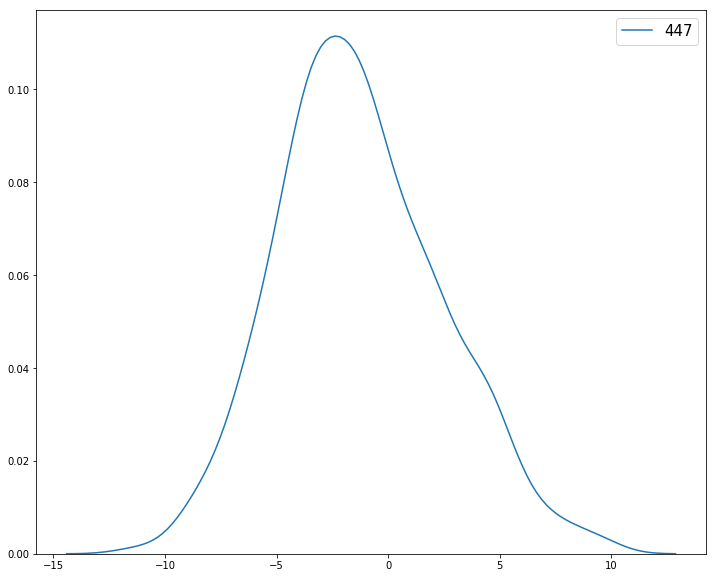

In [21]:
sns.kdeplot(df_train[447])
plt.legend(prop={'size':15})

In [22]:
# for col in Num_col_NonNorm:
#     index_list=index_outlier(X_train[col],False)
#     value_impute=np.median(X_train[col])
#     for index in index_list:
#         X_train.loc[index,col]=value_impute

#### select different feature set by different approach: F-test, pearson correlation

In [23]:
res=[]
for col in Num_col:
    res.append((col,corv(df,col,'Class')[0],f_anova(df,col,[0,1,2],'Class')[1],H_test(df,col,[0,1,2],'Class')[1]))
res

[(3, -0.03662181693354525, 0.8061693601796786, 0.7969868183157934),
 (4, -0.01346994076286346, 0.3972499665692476, 0.47181419926157264),
 (5, 0.10845656620139393, 0.4139556336623281, 0.592325320630797),
 (6, -0.07097548738579595, 0.6086681574555468, 0.6226628547114992),
 (7, 0.048250256454705084, 0.720106870324912, 0.7808548127933661),
 (8, 0.03599287725290489, 0.33515930780104275, 0.12911642968327866),
 (9, -0.12698162455571055, 0.32493718037939406, 0.4890685989859891),
 (10, -0.012814308136080244, 0.6308002880204662, 0.7500686508420654),
 (11, -0.014890252361432316, 0.4986124493681894, 0.5865591592699895),
 (12, -0.12460810373157932, 0.04636709791968722, 0.03680210377080589),
 (13, -0.0694951760711949, 0.44010942164816746, 0.3535248958850609),
 (14, -0.01871592506917102, 0.9329996124988056, 0.8061379239863855),
 (15, -0.02267554071116351, 0.8807388161509904, 0.9993787716662215),
 (16, -0.17898758445312501, 0.04900921156342918, 0.04102659273567499),
 (17, 0.026334703149441013, 0.91418

In [24]:
#get the columns which don't have much info to influence the class
Num_high_corr=[x[0] for x in res if abs(x[1])>=0.1]
Num_high_sign=[x[0] for x in res if x[2]<=0.05]

#### visualize them to see the difference

c:\program files\python3.6.0\lib\site-packages\scipy\stats\stats.py:1706: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
c:\program files\python3.6.0\lib\site-packages\matplotlib\pyplot.py:528: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


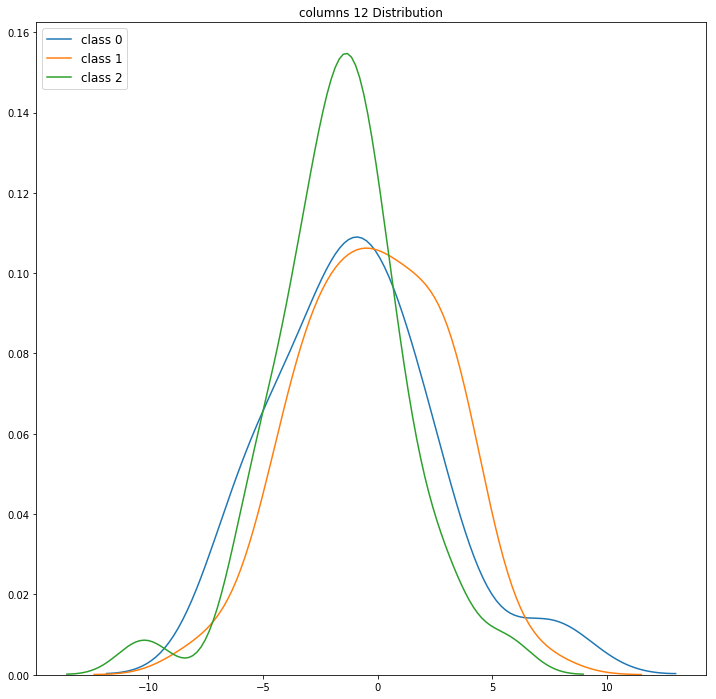

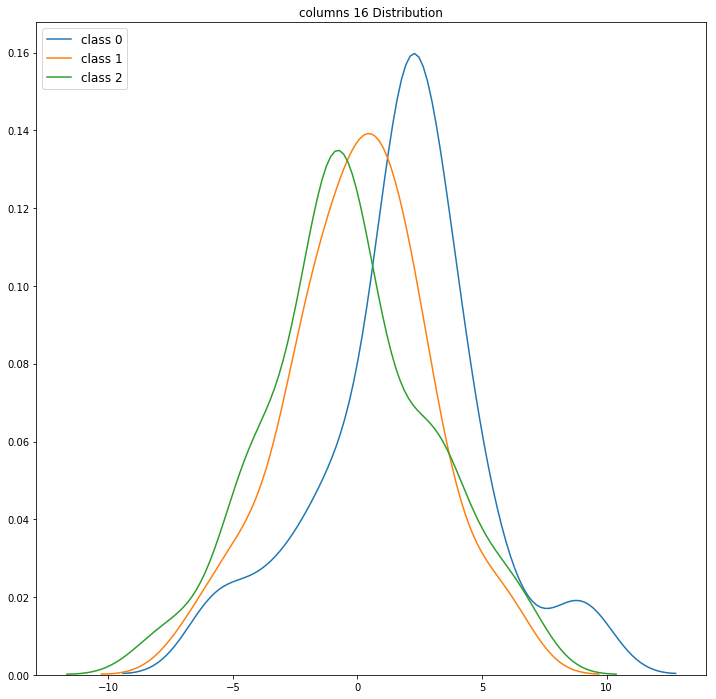

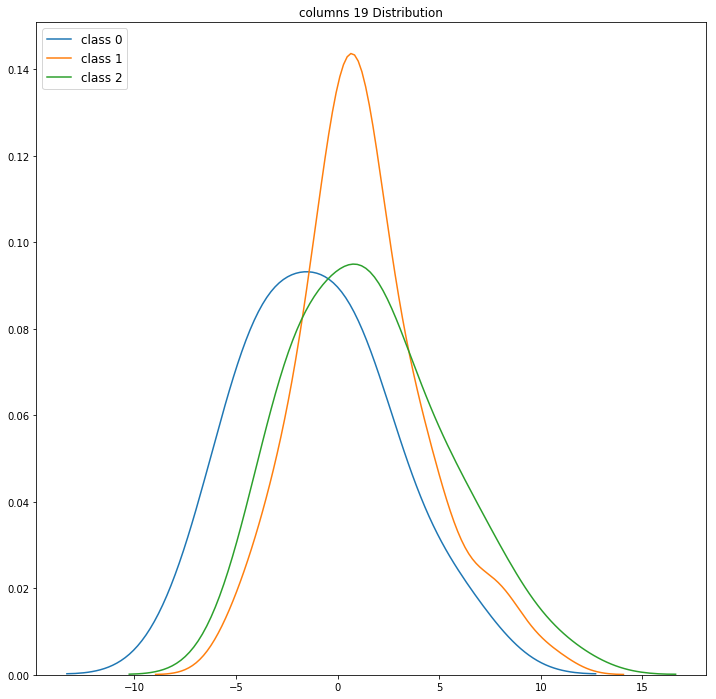

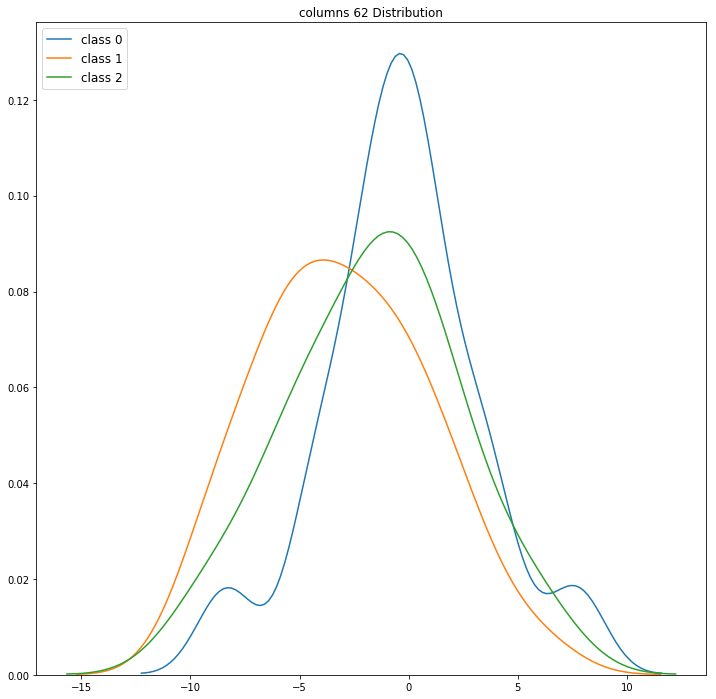

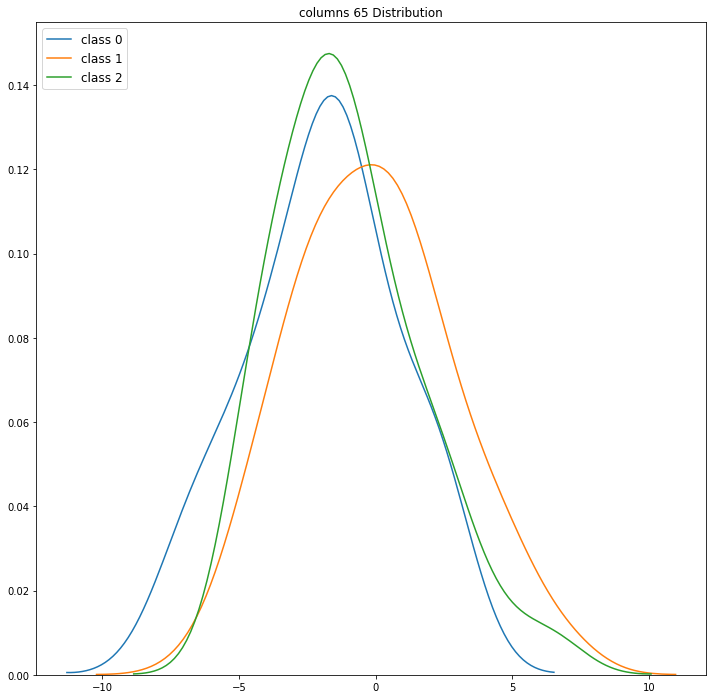

...

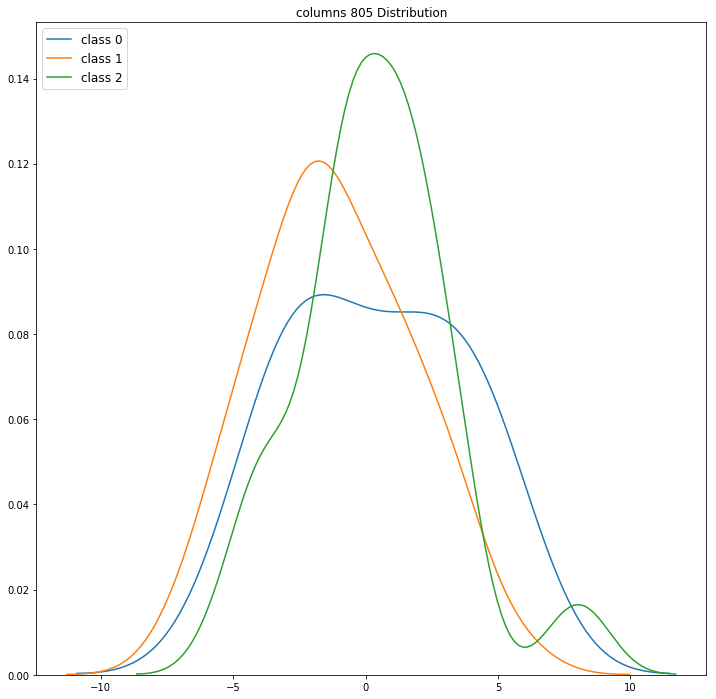

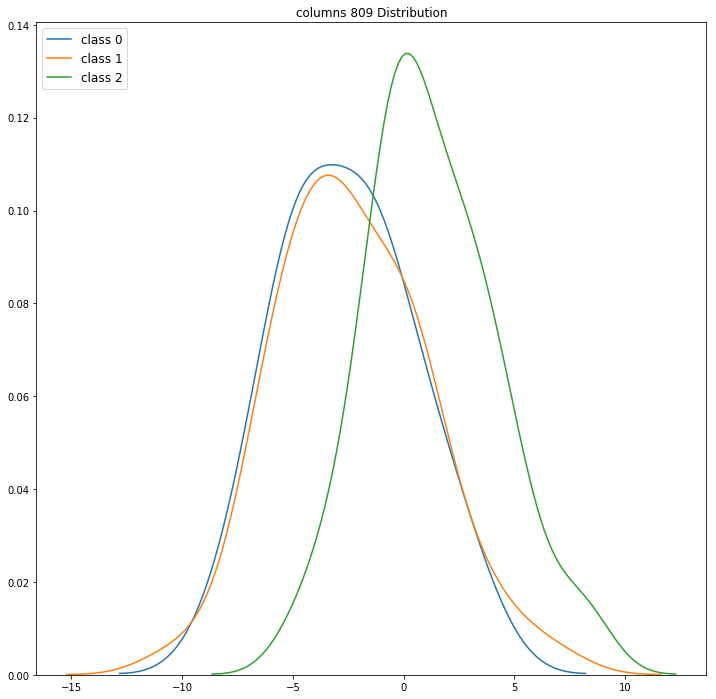

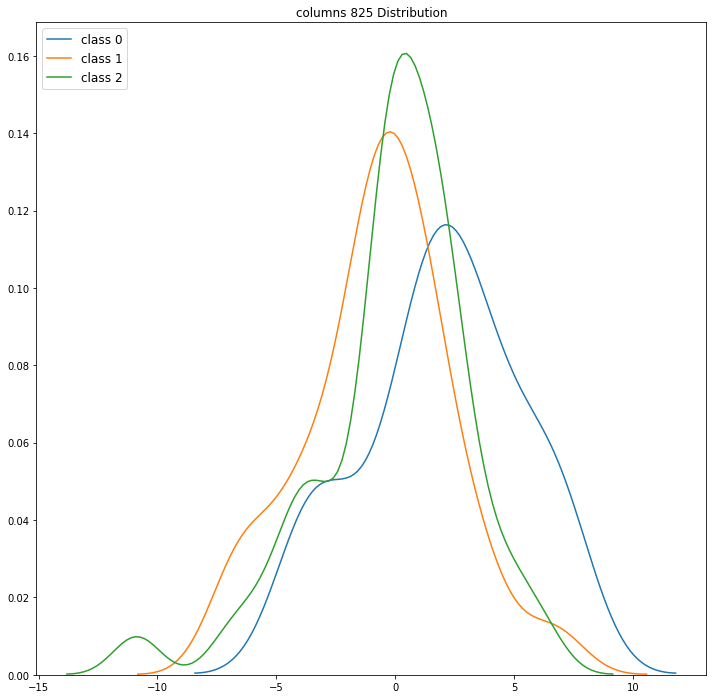

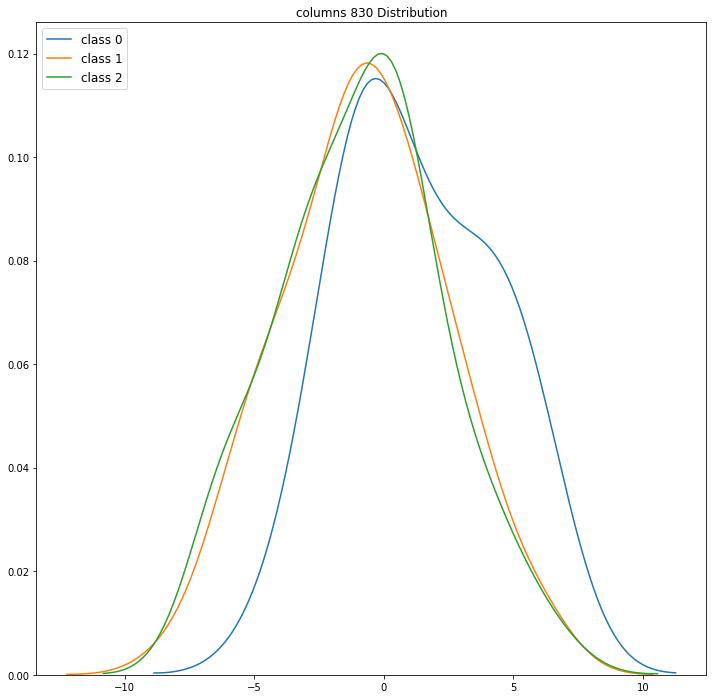

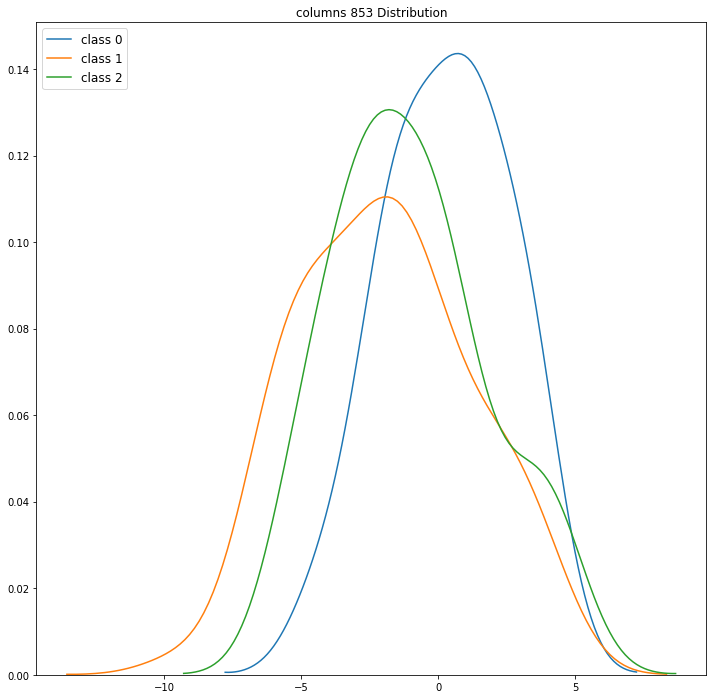

In [24]:
for col in Num_high_sign:
    density_plot(df,col,[0,1,2],'Class')

c:\program files\python3.6.0\lib\site-packages\scipy\stats\stats.py:1706: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
c:\program files\python3.6.0\lib\site-packages\matplotlib\pyplot.py:528: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


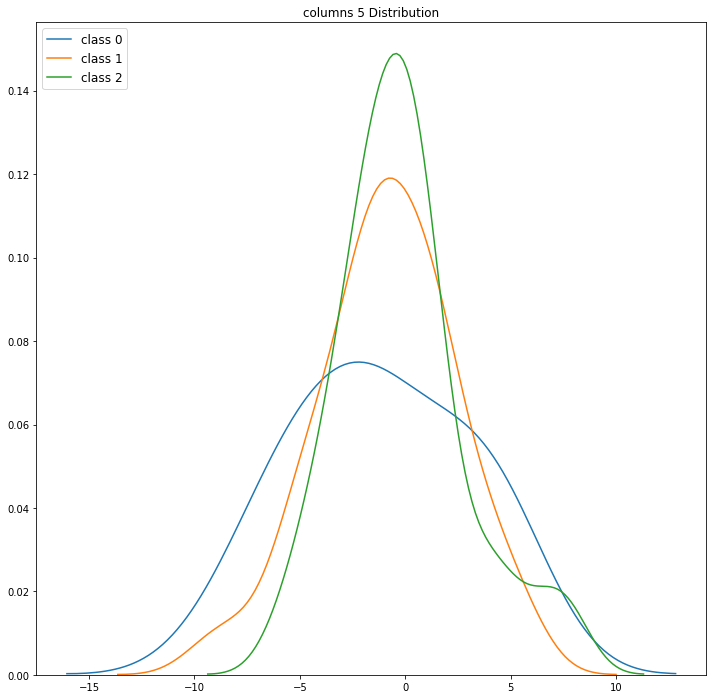

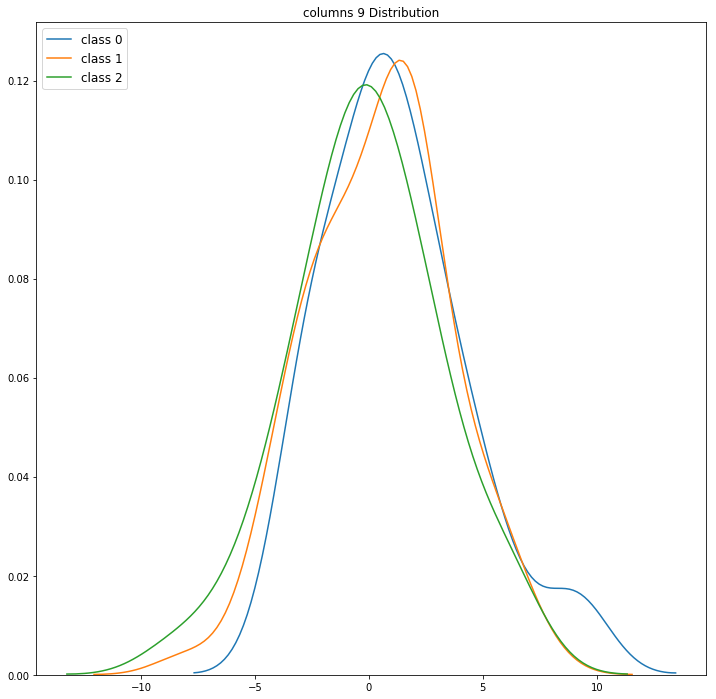

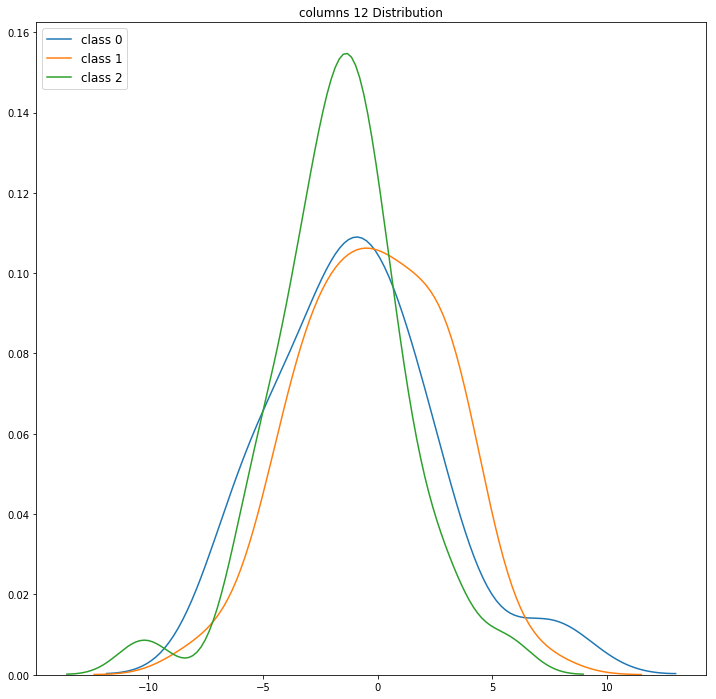

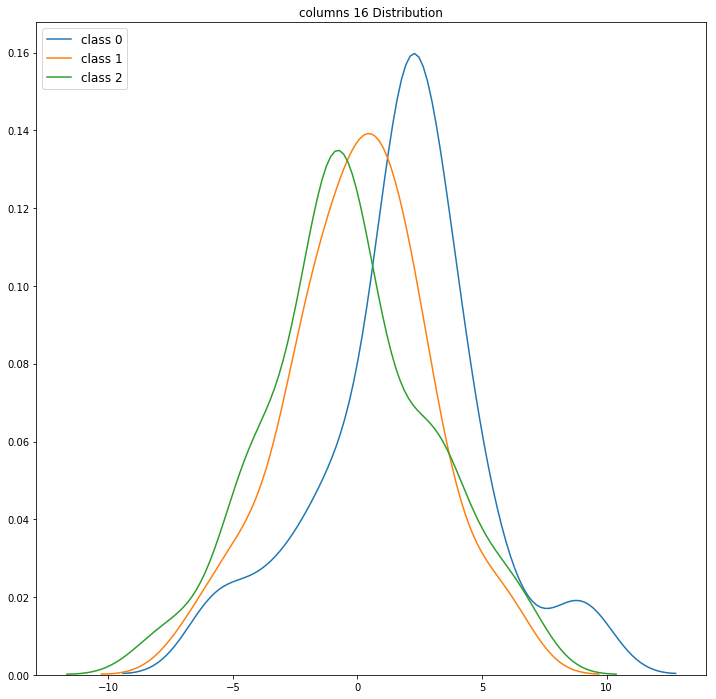

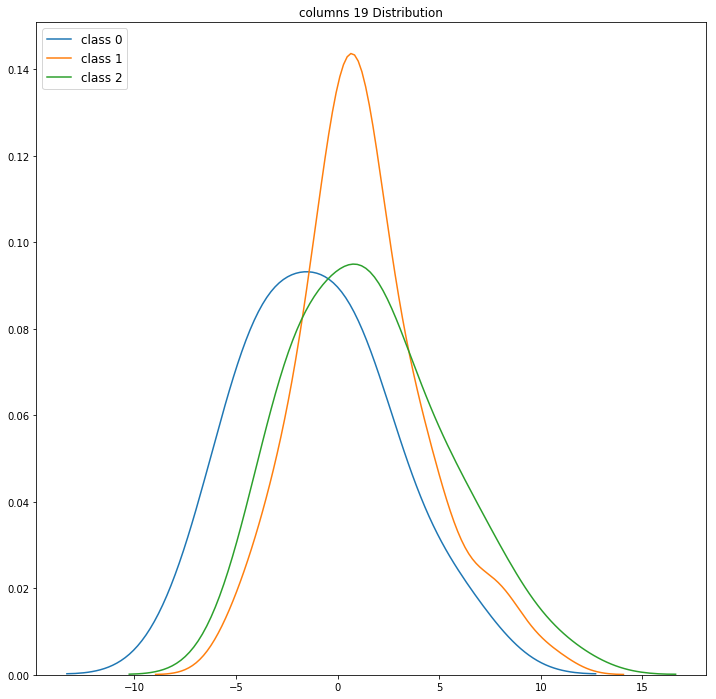

...

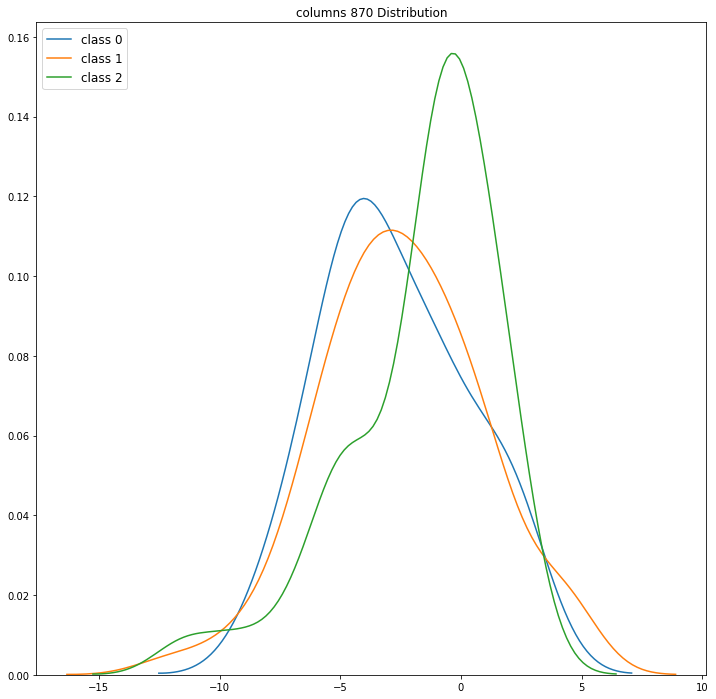

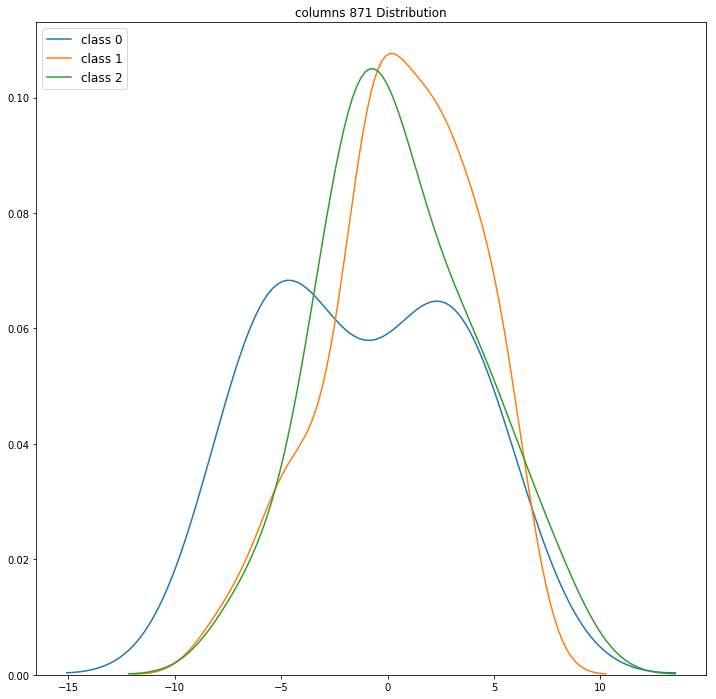

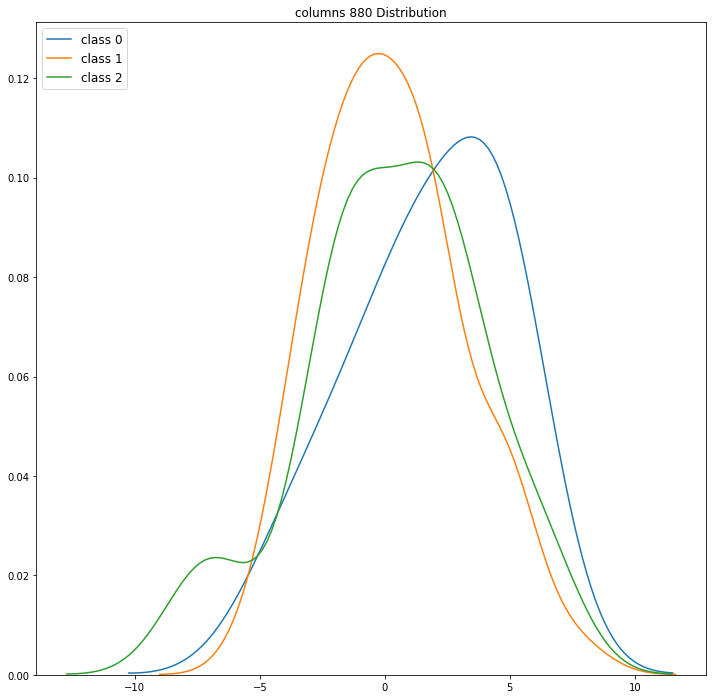

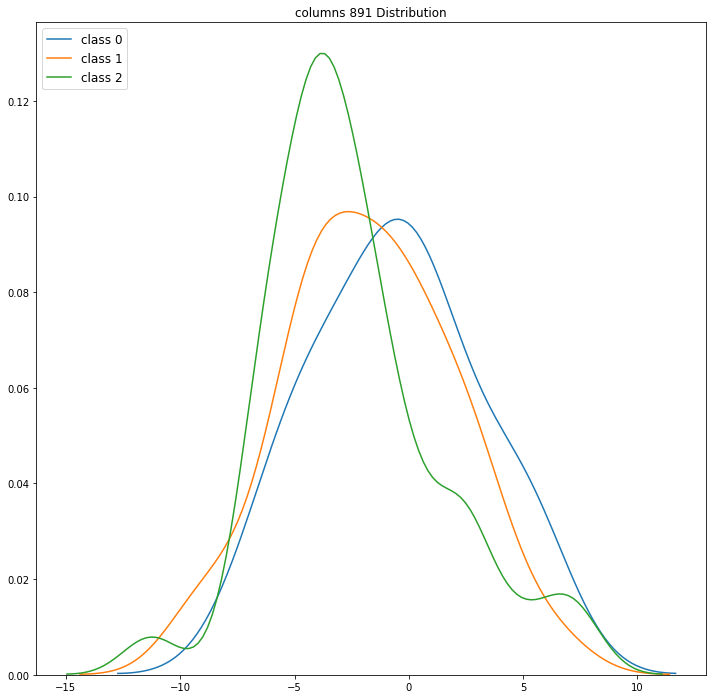

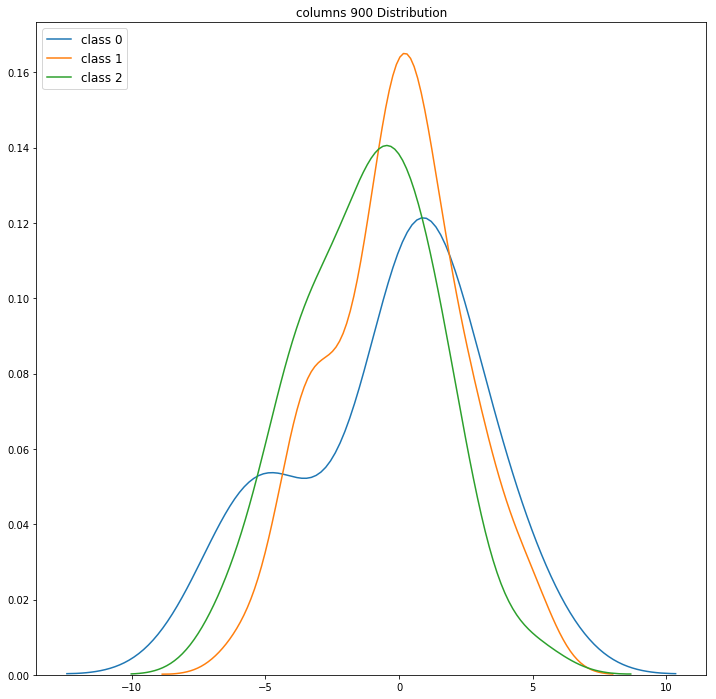

In [25]:
for col in Num_high_corr:
    density_plot(df,col,[0,1,2],'Class')

### category col

#### after we exam, we choose the columns 2 

In [25]:
Cate_col=list(df_train.select_dtypes(include='O').columns)
# pd.unique(df[Cate_col[0]])
Cate_count={k:Counter(df_train[k]) for k in Cate_col}
Cate_count

{0: Counter({'right': 298, 'left': 402}),
 1: Counter({'type_3': 299, 'type_2': 172, 'type_1': 229}),
 2: Counter({'green': 221, 'blue': 177, 'red': 302})}

In [26]:
LB=LabelEncoder()
for col in Cate_col:
    df[col]=LB.fit_transform(df[col])
    df_train[col]=LB.fit_transform(df_train[col])

In [27]:
feature_selection.mutual_info_classif(X=df[[0,1,2]],y=df['Class'],random_state=123)

array([0.0332038 , 0.11590482, 0.00607479])

In [28]:
f_anova(df,col=1,class_label=[0,1,2],class_columns_name='Class')#test the result

(2.6611638531575026, 0.0734777316592099)

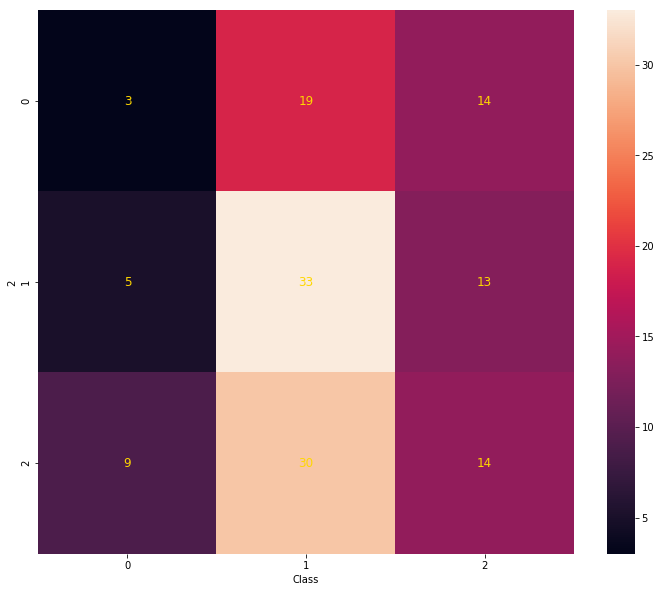

In [29]:
sns.heatmap(pd.crosstab(df[2],df['Class']),annot=True,annot_kws={'fontsize':12,'color':'gold'})

### create feature set

In [30]:
KF=KFold(10)

In [41]:
C=[0.0001,0.001,0.01,0.1,100]

In [46]:
for c in C:
    print('本次模型参数C:{}'.format(c))
    clf=SVC(c)
    print('本次10 fold CV 结果:\r\n {}'.format(cross_val_score(clf,X=df_train.loc[:139,:],y=np.ravel(Y_train['Class']),cv=KF)))
    print('##############################')

本次模型参数C:0.0001
本次10 fold CV 结果:
 [0.71428571 0.21428571 0.57142857 0.57142857 0.78571429 0.78571429
 0.57142857 0.57142857 0.57142857 0.5       ]
##############################
本次模型参数C:0.001
本次10 fold CV 结果:
 [0.71428571 0.21428571 0.57142857 0.57142857 0.78571429 0.78571429
 0.57142857 0.57142857 0.57142857 0.5       ]
##############################
本次模型参数C:0.01
本次10 fold CV 结果:
 [0.71428571 0.21428571 0.57142857 0.57142857 0.78571429 0.78571429
 0.57142857 0.57142857 0.57142857 0.5       ]
##############################
本次模型参数C:0.1
本次10 fold CV 结果:
 [0.71428571 0.21428571 0.57142857 0.57142857 0.78571429 0.78571429
 0.57142857 0.57142857 0.57142857 0.5       ]
##############################
本次模型参数C:100
本次10 fold CV 结果:
 [0.71428571 0.21428571 0.57142857 0.57142857 0.78571429 0.78571429
 0.57142857 0.57142857 0.57142857 0.5       ]
##############################


### manual approach based on F-test and pearson correlation

In [33]:
Y=np.ravel(Y_train['Class'])

In [34]:
target_col_intersect=list(set(Num_high_corr).intersection(set(Num_high_sign)))
target_col_all=list(set(Num_high_corr).union(set(Num_high_sign)))

In [35]:
LR=LogisticRegression(C=1,multi_class='ovr',penalty='l1',fit_intercept=True,solver='liblinear')
cross_val_score(LR,X=X_train[target_col_all],y=np.ravel(Y_train['Class']),cv=KF)

array([0.92857143, 1.        , 1.        , 0.92857143, 0.92857143,
       1.        , 1.        , 0.92857143, 1.        , 0.85714286])

In [35]:
LR=LogisticRegression(C=1,multi_class='ovr',penalty='l1',fit_intercept=True,solver='liblinear')
cross_val_score(LR,X=X_train[target_col_intersect],y=np.ravel(Y_train['Class']),cv=KF)

array([0.92857143, 0.92857143, 0.89285714, 0.92857143, 1.        ])

### PCA approach

In [36]:
Clf=PCA(n_components=10)
SS=StandardScaler(with_mean=True,with_std=True)
temp=X_train.select_dtypes(exclude='O').copy()
# temp=df[target_col_all]
LR=LogisticRegression(C=1,multi_class='ovr',penalty='l1',fit_intercept=True)
My_Pipe=Pipeline([('Normalize',SS),('Reduction',Clf),('classify',LR)])
for train,test in KF.split(temp):
    My_Pipe.set_params(classify__C=2,classify__penalty='l1',classify__multi_class='ovr',classify__solver='liblinear').fit(temp.iloc[list(train),:],Y[list(train)])
    print(accuracy_score(Y[list(test)],My_Pipe.predict(temp.iloc[list(test),:])))

0.42857142857142855
0.5
0.7142857142857143
0.5714285714285714
0.6071428571428571


### Random forest approach

In [37]:
RF=RandomForestClassifier()
RF.fit(temp,np.ravel(Y_train['Class']))
target_col_RF=temp.columns[RF.feature_importances_!=0]

c:\program files\python3.6.0\lib\site-packages\sklearn\ensemble\forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


In [38]:
LR=LogisticRegression(C=1,multi_class='ovr',penalty='l1',fit_intercept=True,solver='liblinear')
cross_val_score(LR,X=df[target_col_RF],y=np.ravel(Y_train['Class']),cv=KF)

array([0.89285714, 0.92857143, 0.89285714, 0.82142857, 0.89285714])

### as we exam all different feature set, we decide to move forward with target_col_all
### there are several reason:
### first, the score is the highest
### second, we got more information since it contain more significant columns and we could use shrinkage to prevent overfitting

## deal with imbalance data set

In [39]:
SS=StandardScaler()
X_total=pd.DataFrame(SS.fit_transform(df_train[target_col_all]))
X_total.insert(column='Cat',value=df_train[2],loc=0)
X=X_total.iloc[:140,:]


In [40]:
SE=SMOTE()
X_res,Y_res=SE.fit_resample(X,Y)

In [41]:
X=pd.DataFrame(X_res)
Y=pd.Series(Y_res)

## Model

In [42]:
My_acc=make_scorer(accuracy_score)
KF=KFold(n_splits=5,random_state=126)

In [43]:
X.head()

,0,1,2,3,4,5,6,7,8,9,...,187,188,189,190,191,192,193,194,195,196
0,1.0,0.629980,0.530400,-0.633731,0.517918,-0.490542,0.717005,0.707159,-0.191922,0.086627,...,-0.607341,1.331568,-1.918800,-1.303017,-1.214057,0.907486,0.588774,-1.381854,0.669158,0.154369
1,0.0,-0.211266,0.502790,-0.379174,-0.976427,-0.027405,0.260433,-0.023497,-1.120970,-1.329157,...,-1.596804,1.135265,-0.909193,-0.651464,-1.272070,0.014733,-1.032879,-0.346097,0.544117,0.479620
2,1.0,-0.134752,-0.997789,0.942114,0.788977,0.200571,-1.032209,-0.037474,0.331199,-1.620848,...,0.074577,-1.014764,0.045012,-0.781469,2.742066,-0.521987,-0.413108,-0.628454,-1.941715,-0.989258
3,2.0,-0.772293,0.883156,0.253711,-0.079008,1.714432,1.022368,-2.149679,0.469268,-0.003497,...,1.343285,-0.504992,-2.436640,-0.441112,-0.204015,1.304866,-0.343610,0.260477,-0.298587,-1.886403
4,0.0,-1.668360,0.604768,0.012505,-0.792880,-0.363268,-1.807117,1.673840,-0.362978,0.307010,...,-0.163335,0.405089,0.810565,-1.855006,-1.194055,0.891275,0.290026,-0.971303,0.998102,0.615806


#### Logistic regression

In [44]:
parameter={'C':np.arange(0.2,2.2,0.2),'penalty':['l1','l2']}
LR=LogisticRegression(fit_intercept=True,multi_class='ovr')
clf=GridSearchCV(LR,parameter,cv=3)
clf.fit(X,Y)
clf.best_params_

c:\program files\python3.6.0\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
c:\program files\python3.6.0\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
c:\program files\python3.6.0\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
c:\program files\python3.6.0\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
c:\program files\python3.6.0\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a

c:\program files\python3.6.0\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
c:\program files\python3.6.0\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
c:\program files\python3.6.0\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
c:\program files\python3.6.0\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
c:\program files\python3.6.0\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a

{'C': 0.8, 'penalty': 'l1'}

In [46]:
for train,test in KF.split(X):
#     print(Y_train.iloc[list(test)])
    LR=LogisticRegression(fit_intercept=True,multi_class='ovr',penalty='l1',C=1.2,solver='liblinear')
    LR.fit(X=X.iloc[list(train),:],y=Y[list(train)])
    Y_pre=LR.predict(X.iloc[list(test)])
    print(accuracy_score(Y_pre,Y[list(test)]))

1.0
0.9591836734693877
1.0
1.0
1.0


#### SVM (linear one since the data already in the high dimension, using kernel will cause overfitting)

In [47]:
parameters = {'kernel':('linear', 'rbf'), 'C':np.arange(0.2,4,0.4)}
svr = SVC()
clf=GridSearchCV(svr,parameters,cv=3)
clf.fit(X,Y)
clf.best_params_

c:\program files\python3.6.0\lib\site-packages\sklearn\svm\base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
c:\program files\python3.6.0\lib\site-packages\sklearn\svm\base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
c:\program files\python3.6.0\lib\site-packages\sklearn\svm\base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
c:\program files\python3.6.0\lib\site-packages\sklearn\svm\base.py:

{'C': 0.2, 'kernel': 'linear'}

In [45]:
for train,test in KF.split(X):
#     print(Y_train.iloc[list(test)])
    svr = SVC(C=0.2,kernel='linear')
    svr.fit(X=X.iloc[list(train),:],y=Y[list(train)])
    Y_pre=svr.predict(X.iloc[list(test)])
    print(accuracy_score(Y_pre,Y[list(test)]))

0.98
0.9591836734693877
0.9795918367346939
1.0
1.0


#### Rondom Forest

In [ ]:
parameters = {'n_estimators':np.arange(10,100,10), 'max_depth':np.arange(1,4,1),'min_samples_split':np.arange(2,5,1),
             'min_samples_leaf':np.arange(1,5,1),'max_features':['auto','sqrt','log2']}
RF = RandomForestClassifier(bootstrap=True)
clf=GridSearchCV(RF,parameters,cv=3)
clf.fit(X,Y)
clf.best_params_

In [50]:
for train,test in KF.split(X):
#     print(Y_train.iloc[list(test)])
    RF = RandomForestClassifier(bootstrap=True,max_depth=3,max_features='sqrt',
                                min_samples_leaf=2,min_samples_split=4,n_estimators=60)
    RF.fit(X=X.iloc[list(train),:],y=Y[list(train)])
    Y_pre=RF.predict(X.iloc[list(test)])
    print(accuracy_score(Y_pre,Y[list(test)]))

0.9
0.8775510204081632
0.9387755102040817
0.673469387755102
0.8571428571428571


#### GBDT

In [51]:
parameters = {'n_estimators':np.arange(10,100,10), 'max_depth':np.arange(1,4,1),'min_samples_split':np.arange(2,5,1),
             'min_samples_leaf':np.arange(1,5,1),'max_features':['auto','sqrt','log2']}
GB = GradientBoostingClassifier()
clf=GridSearchCV(GB,parameters,cv=3)
clf.fit(X,Y)
clf.best_params_

In [52]:
for train,test in KF.split(X):
#     print(Y_train.iloc[list(test)])
    GB = GradientBoostingClassifier(max_depth=2,max_features='sqrt',
                                min_samples_leaf=2,min_samples_split=3,n_estimators=70)
    GB.fit(X=X.iloc[list(train),:],y=Y[list(train)])
    Y_pre=GB.predict(X.iloc[list(test)])
    print(accuracy_score(Y_pre,Y[list(test)]))

1.0
0.9183673469387755
0.9795918367346939
1.0
1.0


#### XGboost

In [53]:
Boost_clf=xgboost.XGBClassifier(objective='softmax',alpha=1)
parameters={'n_estimatores':list(np.arange(50,200,10)),
            'max_depth':np.arange(1,4,1),'min_samples_split':np.arange(2,5,1),
             'min_samples_leaf':np.arange(1,5,1),'max_features':['auto','sqrt','log2']}
clf=GridSearchCV(Boost_clf,parameters,cv=3)
clf.fit(X,Y)
clf.best_params_

In [54]:
for train,test in KF.split(X):
#     print(Y_train.iloc[list(test)])
    XGB = xgboost.XGBClassifier(max_depth=1,max_features='auto',
                                min_samples_leaf=1,min_samples_split=2,n_estimators=50)
    XGB.fit(X=X.iloc[list(train),:],y=Y[list(train)])
    Y_pre=XGB.predict(X.iloc[list(test)])
    print(accuracy_score(Y_pre,Y[list(test)]))

0.86
0.9183673469387755
0.9183673469387755
1.0
0.9795918367346939


#### Stacking

In [55]:
LR=LogisticRegression(fit_intercept=True,multi_class='ovr',penalty='l1',C=1.2,solver='liblinear')
svr = SVC(C=0.2,kernel='linear')
RF = RandomForestClassifier(bootstrap=True,max_depth=3,max_features='sqrt',
                                min_samples_leaf=2,min_samples_split=4,n_estimators=60)
GB = GradientBoostingClassifier(max_depth=2,max_features='sqrt',
                                min_samples_leaf=2,min_samples_split=3,n_estimators=70)
XGB = xgboost.XGBClassifier(max_depth=2,max_features='auto',
                                min_samples_leaf=2,min_samples_split=3,n_estimators=90)

In [56]:
models=[LR,svr,RF,GB,XGB]

In [79]:
X_TRAIN, X_TEST, Y_TRAIN, Y_TEST = train_test_split(X, Y, test_size=0.2, random_state=20)

In [80]:
S_train,S_test=stacking(models,X_TRAIN,Y_TRAIN,X_TEST,regression=False,metric=accuracy_score,verbose=2)

task:         [classification]
n_classes:    [3]
metric:       [accuracy_score]
mode:         [oof_pred_bag]
n_models:     [5]

model  0:     [LogisticRegression]
    fold  0:  [1.00000000]
    fold  1:  [1.00000000]
    fold  2:  [0.91836735]
    fold  3:  [0.97959184]
    ----
    MEAN:     [0.97448980] + [0.03345632]
    FULL:     [0.97448980]

model  1:     [SVC]
    fold  0:  [1.00000000]
    fold  1:  [1.00000000]
    fold  2:  [0.93877551]
    fold  3:  [1.00000000]
    ----
    MEAN:     [0.98469388] + [0.02651098]
    FULL:     [0.98469388]

model  2:     [RandomForestClassifier]
    fold  0:  [0.97959184]
    fold  1:  [0.95918367]
    fold  2:  [0.91836735]
    fold  3:  [0.93877551]
    ----
    MEAN:     [0.94897959] + [0.02281702]
    FULL:     [0.94897959]

model  3:     [GradientBoostingClassifier]
    fold  0:  [0.97959184]
    fold  1:  [1.00000000]
    fold  2:  [0.93877551]
    fold  3:  [1.00000000]
    ----
    MEAN:     [0.97959184] + [0.02499479]
    FULL:     [

In [81]:
parameters = {'kernel':('linear', 'rbf'), 'C':np.arange(0.2,4,0.4)}
svr = SVC()
clf=GridSearchCV(svr,parameters,cv=3)
clf.fit(S_train,Y_TRAIN)
clf.best_params_

c:\program files\python3.6.0\lib\site-packages\sklearn\svm\base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
c:\program files\python3.6.0\lib\site-packages\sklearn\svm\base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
c:\program files\python3.6.0\lib\site-packages\sklearn\svm\base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
c:\program files\python3.6.0\lib\site-packages\sklearn\svm\base.py:

{'C': 0.2, 'kernel': 'linear'}

In [82]:
svr = SVC(C=0.2,kernel='linear')
model=svr.fit(S_train,Y_TRAIN)
Y_PRE=model.predict(S_test)
accuracy_score(Y_PRE,Y_TEST)

1.0

## Predict
### Finally we choose the stacking model

In [61]:
X_test=X_total.loc[140:,:]

In [62]:
LR=LogisticRegression(fit_intercept=True,multi_class='ovr',penalty='l1',C=1.2,solver='liblinear')
svr = SVC(C=0.2,kernel='linear')
RF = RandomForestClassifier(bootstrap=True,max_depth=3,max_features='sqrt',
                                min_samples_leaf=2,min_samples_split=4,n_estimators=60)
GB = GradientBoostingClassifier(max_depth=2,max_features='sqrt',
                                min_samples_leaf=2,min_samples_split=3,n_estimators=70)
XGB = xgboost.XGBClassifier(max_depth=2,max_features='auto',
                                min_samples_leaf=2,min_samples_split=3,n_estimators=90)

In [63]:
models=[LR,svr,RF,GB,XGB]

In [64]:
S_train,S_test=stacking(models,X,Y,X_test,regression=False,metric=accuracy_score)

In [65]:
CLF = SVC(C=0.2,kernel='linear')

In [66]:
CLF.fit(S_train,Y)

SVC(C=0.2, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma='auto_deprecated',
  kernel='linear', max_iter=-1, probability=False, random_state=None,
  shrinking=True, tol=0.001, verbose=False)

In [67]:
Y_pre=CLF.predict(S_test)

In [68]:
Y_pre.__len__()

560

In [69]:
pd.DataFrame({'result':Y_pre}).to_csv('c:/users/administrator/desktop/proofpoint/test_predictions.csv')